In [19]:
import librosa
import IPython.display as ipd
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import IPython
from scipy.io import wavfile
import scipy.signal

In [15]:
import math
from pysndfx import AudioEffectsChain

In [ ]:
text = 'ဘုရားဖူး  သွား  ကြ  မယ်'

In [7]:
mic_on_female,sr = librosa.load('./output/micon1.wav',sr=None)

In [5]:
ipd.Audio('./output/micon1.wav')

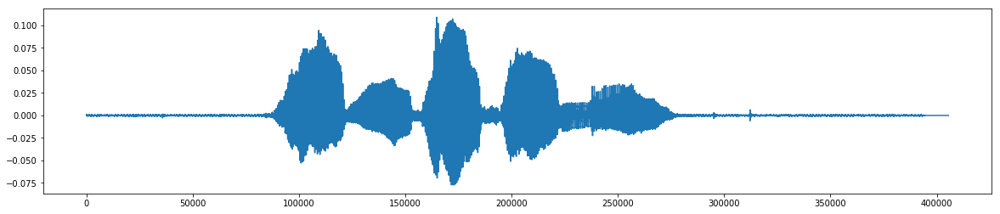

In [10]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(mic_on_female)

# Mic Off

In [33]:
mic_off_female,sr1 = librosa.load('./output/micoff1.wav',sr=None)

In [34]:
ipd.Audio('./output/micoff1.wav')

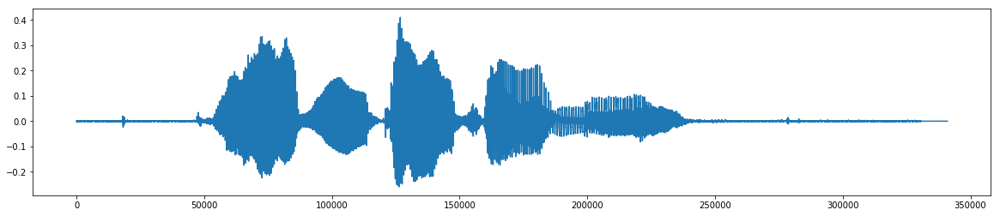

In [35]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(mic_off_female)

# Without Mic

In [43]:
ipd.Audio('./output/without_mic1.wav')


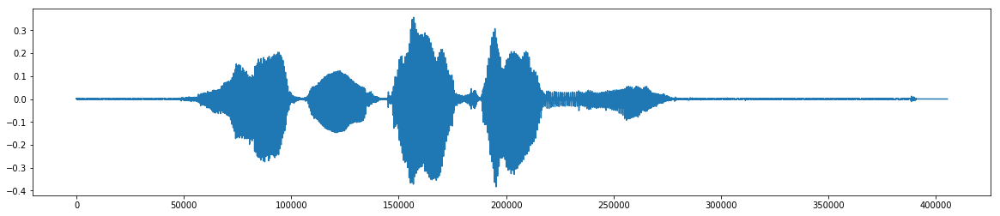

In [44]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(without_mic_female)

# With Phone

In [51]:
ipd.Audio('./output/phone1.wav')

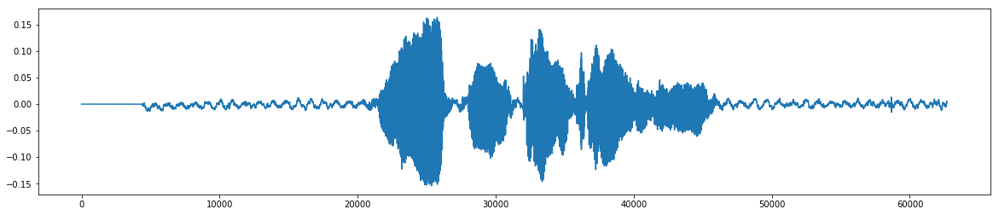

In [52]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(with_ph_female)

# Mic Off Harmonic

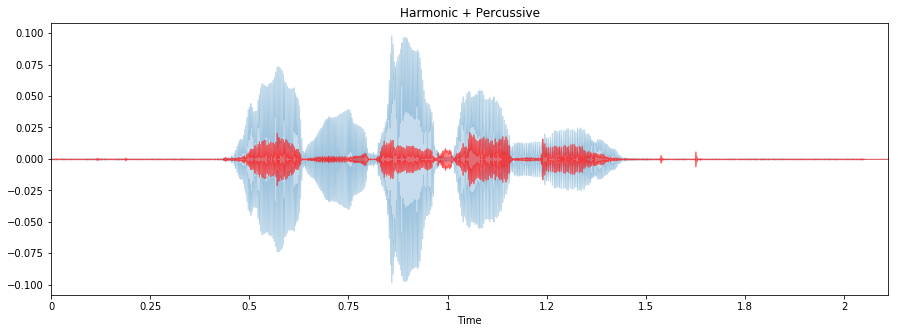

In [22]:
y_harmonic, y_percussive = librosa.effects.hpss(mic_on_female)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(y_harmonic, sr=sr, alpha=0.25)
librosa.display.waveplot(y_percussive, sr=sr, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')

# Mic On Harmonic

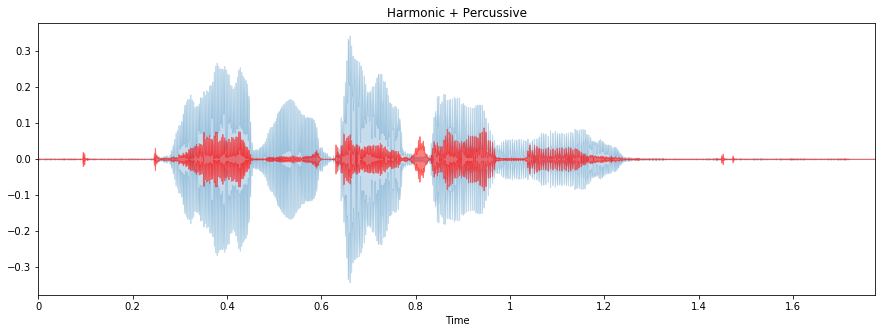

In [36]:
y_harmonic, y_percussive = librosa.effects.hpss(mic_off_female)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(y_harmonic, sr=sr1, alpha=0.25)
librosa.display.waveplot(y_percussive, sr=sr1, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')

# Without mic

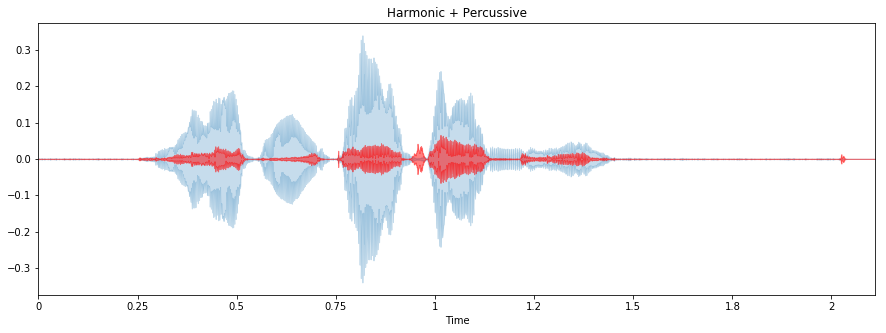

In [45]:
y_harmonic, y_percussive = librosa.effects.hpss(without_mic_female)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(y_harmonic, sr=sr2, alpha=0.25)
librosa.display.waveplot(y_percussive, sr=sr2, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')

# With Phone Harmonic

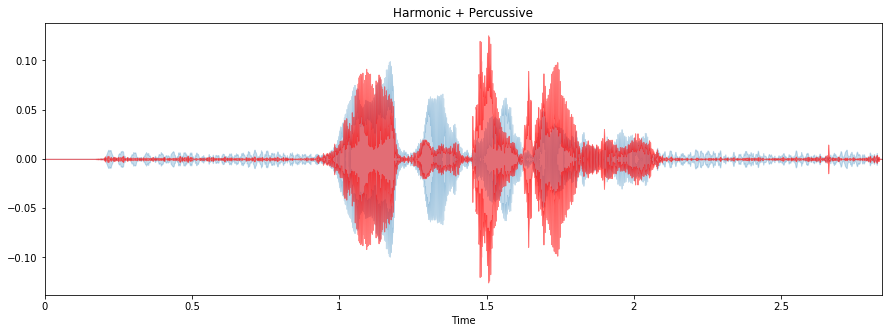

In [53]:
y_harmonic, y_percussive = librosa.effects.hpss(with_ph_female)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(y_harmonic, sr=sr3, alpha=0.25)
librosa.display.waveplot(y_percussive, sr=sr3, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')

# Mic On MFCC

'Mel-frequency cepstral coefficients (MFCCs) are coefficients that collectively make up an MFC. They are derived from a type of cepstral representation of the audio clip (a nonlinear "spectrum-of-a-spectrum"). The difference between the cepstrum and the mel-frequency cepstrum is that in the MFC, the frequency bands are equally spaced on the mel scale, which approximates the human auditory systems response more closely than the linearly-spaced frequency bands used in the normal cepstrum. This frequency warping can allow for better representation of sound, for example, in audio compression.'

/usr/local/lib/python3.5/dist-packages/librosa/filters.py:284: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  warnings.warn('Empty filters detected in mel frequency basis. '


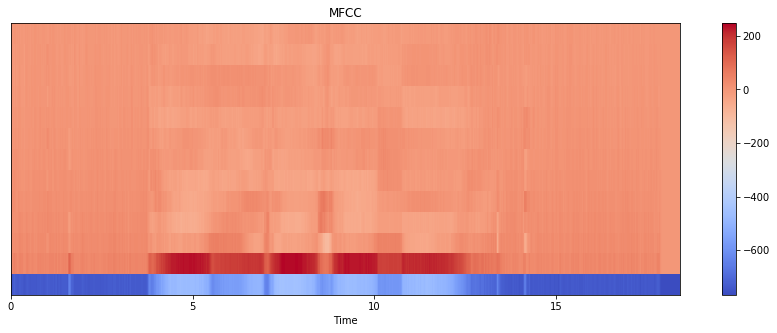

In [93]:
mfccs_on = librosa.feature.mfcc(y=mic_on_female, sr=sr, n_mfcc=13)
plt.figure(figsize=(15, 5))
librosa.display.specshow(mfccs_on, x_axis='time')
plt.colorbar()
plt.title('MFCC')

# Mic Off Mfcc

/usr/local/lib/python3.5/dist-packages/librosa/filters.py:284: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  warnings.warn('Empty filters detected in mel frequency basis. '


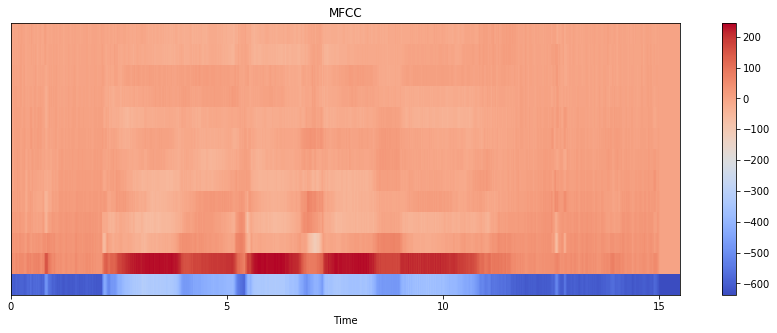

In [94]:
mfccs_off = librosa.feature.mfcc(y=mic_off_female, sr=sr1, n_mfcc=13)
plt.figure(figsize=(15, 5))
librosa.display.specshow(mfccs_off, x_axis='time')
plt.colorbar()
plt.title('MFCC')

# Without Mic MFCC

/usr/local/lib/python3.5/dist-packages/librosa/filters.py:284: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  warnings.warn('Empty filters detected in mel frequency basis. '


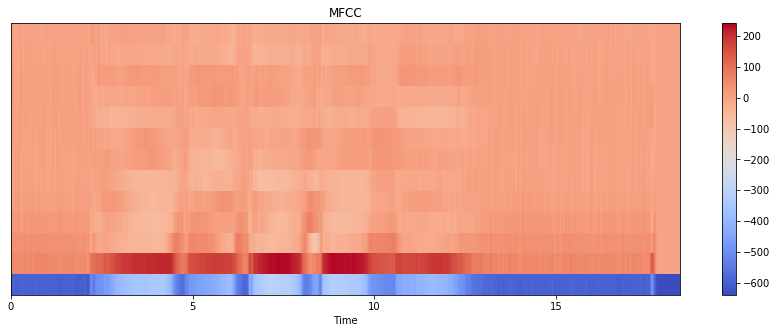

In [95]:
mfccs_w_m = librosa.feature.mfcc(y=without_mic_female, sr=sr2, n_mfcc=13)
plt.figure(figsize=(15, 5))
librosa.display.specshow(mfccs_w_m, x_axis='time')
plt.colorbar()
plt.title('MFCC')

# With Phone

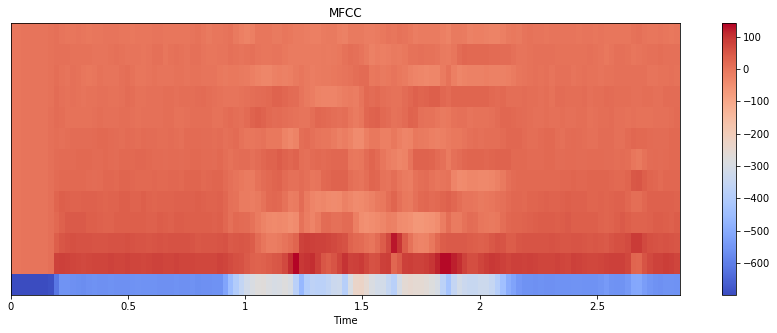

In [96]:
mfccs_p = librosa.feature.mfcc(y=with_ph_female, sr=sr3, n_mfcc=13)
plt.figure(figsize=(15, 5))
librosa.display.specshow(mfccs_p, x_axis='time')
plt.colorbar()
plt.title('MFCC')

# Mic on spectral centroid

The spectral centroid is a measure used in digital signal processing to characterise a spectrum. It indicates where the "center of mass" of the spectrum is. Perceptually, it has a robust connection with the impression of "brightness" of a sound.

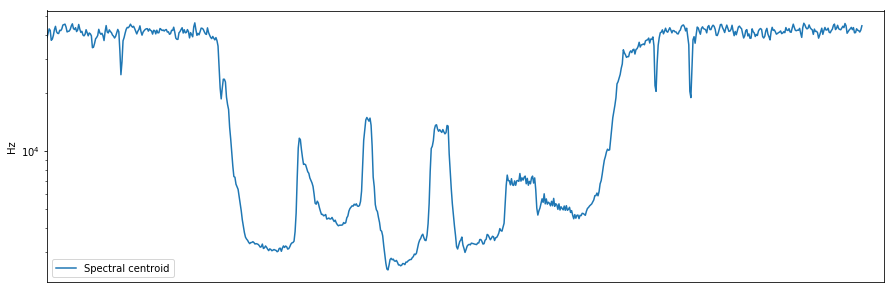

In [24]:
cent = librosa.feature.spectral_centroid(y=mic_on_female, sr=sr)
plt.figure(figsize=(15,5))
plt.subplot(1, 1, 1)
plt.semilogy(cent.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, cent.shape[-1]])
plt.legend()

#  Mic off spectral centroid

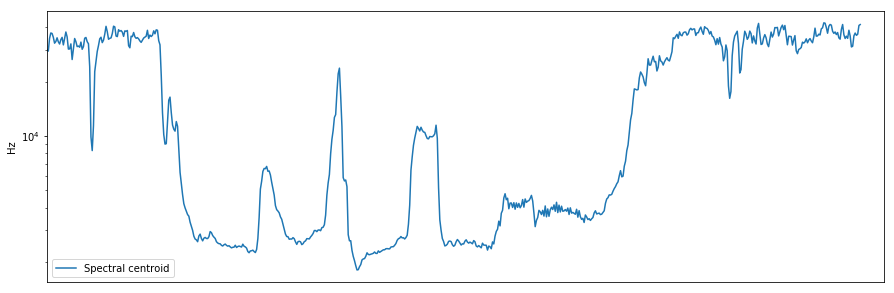

In [38]:
cent = librosa.feature.spectral_centroid(y=mic_off_female, sr=sr1)
plt.figure(figsize=(15,5))
plt.subplot(1, 1, 1)
plt.semilogy(cent.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, cent.shape[-1]])
plt.legend()

# Without Mic Spectral centroid

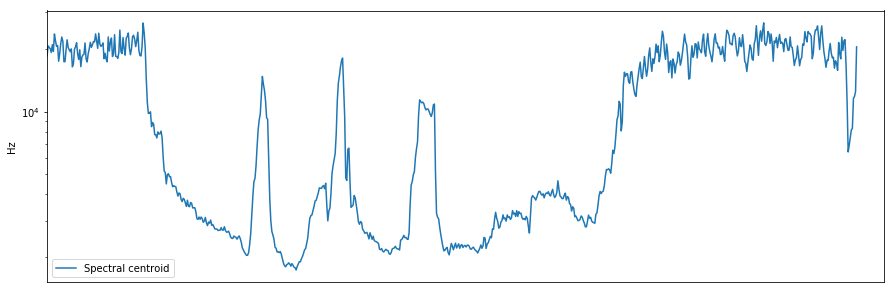

In [48]:
cent = librosa.feature.spectral_centroid(y=without_mic_female, sr=sr2)
plt.figure(figsize=(15,5))
plt.subplot(1, 1, 1)
plt.semilogy(cent.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, cent.shape[-1]])
plt.legend()

# With Phone Spectral centroid

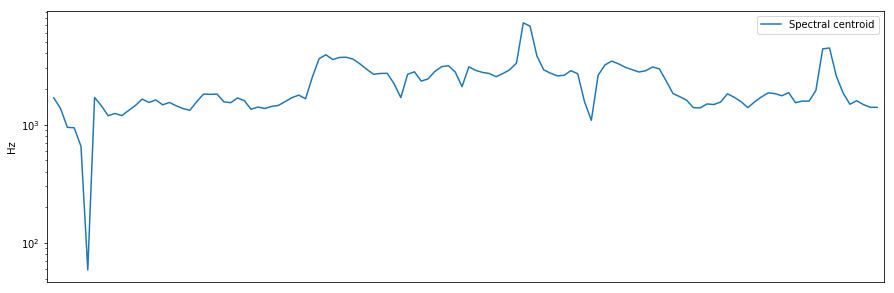

In [56]:
ent = librosa.feature.spectral_centroid(y=with_ph_female, sr=sr3)
plt.figure(figsize=(15,5))
plt.subplot(1, 1, 1)
plt.semilogy(ent.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, ent.shape[-1]])
plt.legend()

To characterize the whole music piece, the mean and standard deviation of MFCC of all frames in a music piece are used as features

,mfccs_mean_0,mfccs_mean_1,mfccs_mean_2,mfccs_mean_3,mfccs_mean_4,mfccs_mean_5,mfccs_mean_6,mfccs_mean_7,mfccs_mean_8,mfccs_mean_9,...,mfccs_std_3,mfccs_std_4,mfccs_std_5,mfccs_std_6,mfccs_std_7,mfccs_std_8,mfccs_std_9,mfccs_std_10,mfccs_std_11,mfccs_std_12
0,-630.084333,115.200896,12.011612,0.075924,6.415937,-3.014801,2.523149,3.25899,-6.193648,-1.917934,...,27.813122,21.571739,21.801641,13.229331,11.144754,14.750004,10.134638,8.372715,11.695533,9.661024


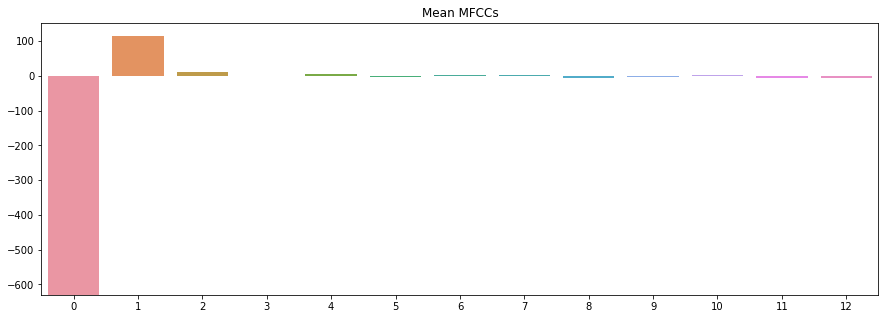

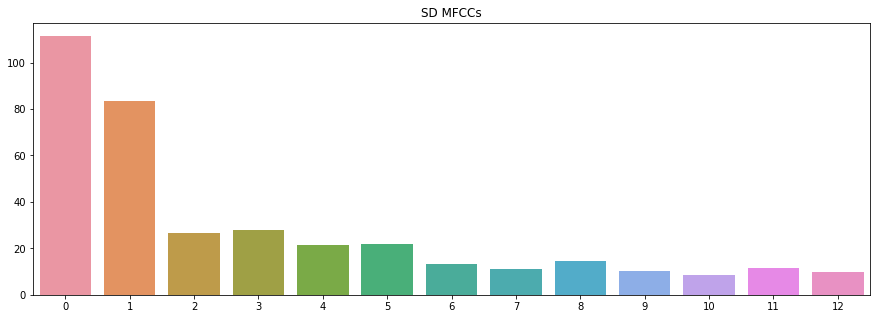

In [97]:
mfccs_mean_on=np.mean(mfccs_on,axis=1)
mfccs_std_on=np.std(mfccs_on,axis=1)

coeffs=np.arange(0,13)
plt.figure(figsize=(15,5))
plt.title('Mean MFCCs')
sns.barplot(x=coeffs,y=mfccs_mean_on)

plt.figure(figsize=(15,5))
plt.title('SD MFCCs')
sns.barplot(x=coeffs,y=mfccs_std_on)
#Generate the chroma Dataframe
mfccs_df=pd.DataFrame()
for i in range(0,13):
    mfccs_df['mfccs_mean_'+str(i)]=mfccs_mean_on[i]
for i in range(0,13):
    mfccs_df['mfccs_std_'+str(i)]=mfccs_mean_on[i]
mfccs_df.loc[0]=np.concatenate((mfccs_mean_on,mfccs_std_on),axis=0)
mfccs_df

,mfccs_mean_0,mfccs_mean_1,mfccs_mean_2,mfccs_mean_3,mfccs_mean_4,mfccs_mean_5,mfccs_mean_6,mfccs_mean_7,mfccs_mean_8,mfccs_mean_9,...,mfccs_std_3,mfccs_std_4,mfccs_std_5,mfccs_std_6,mfccs_std_7,mfccs_std_8,mfccs_std_9,mfccs_std_10,mfccs_std_11,mfccs_std_12
0,-483.097893,132.67547,14.874262,-3.718884,4.44813,-4.944834,0.021098,1.18423,-8.024351,-1.919792,...,28.355097,20.532722,20.012308,12.904612,11.717413,13.754009,9.026828,7.642876,12.767787,10.315772


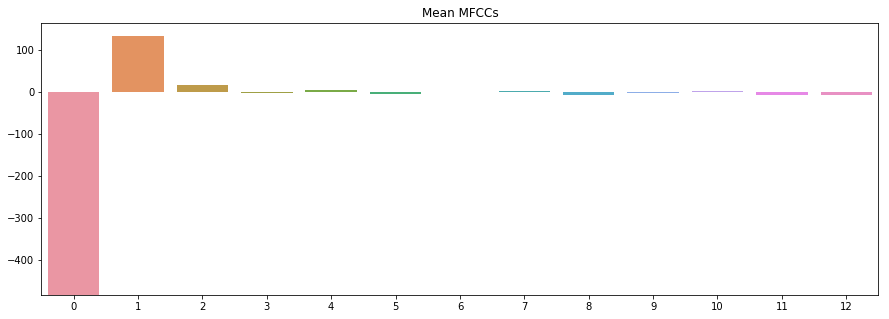

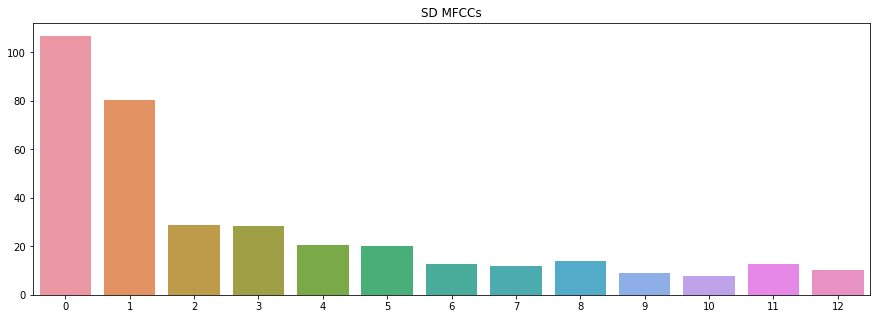

In [98]:
mfccs_mean_off=np.mean(mfccs_off,axis=1)
mfccs_std_off=np.std(mfccs_off,axis=1)

coeffs_off=np.arange(0,13)
plt.figure(figsize=(15,5))
plt.title('Mean MFCCs')
sns.barplot(x=coeffs_off,y=mfccs_mean_off)

plt.figure(figsize=(15,5))
plt.title('SD MFCCs')
sns.barplot(x=coeffs_off,y=mfccs_std_off)
#Generate the chroma Dataframe
mfccs_df_of=pd.DataFrame()
for i in range(0,13):
    mfccs_df_of['mfccs_mean_'+str(i)]=mfccs_mean_off[i]
for i in range(0,13):
    mfccs_df_of['mfccs_std_'+str(i)]=mfccs_mean_off[i]
mfccs_df_of.loc[0]=np.concatenate((mfccs_mean_off,mfccs_std_off),axis=0)
mfccs_df_of

,mfccs_mean_0,mfccs_mean_1,mfccs_mean_2,mfccs_mean_3,mfccs_mean_4,mfccs_mean_5,mfccs_mean_6,mfccs_mean_7,mfccs_mean_8,mfccs_mean_9,...,mfccs_std_3,mfccs_std_4,mfccs_std_5,mfccs_std_6,mfccs_std_7,mfccs_std_8,mfccs_std_9,mfccs_std_10,mfccs_std_11,mfccs_std_12
0,-494.542585,122.766236,15.001447,1.739604,0.431409,-12.456067,0.299549,2.127492,-8.897196,2.069386,...,27.725771,19.514072,20.850811,14.876583,12.008836,16.44241,10.365888,9.276928,12.363894,8.555582


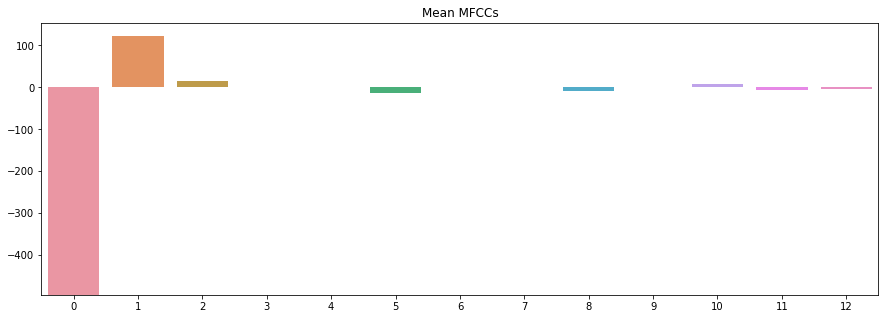

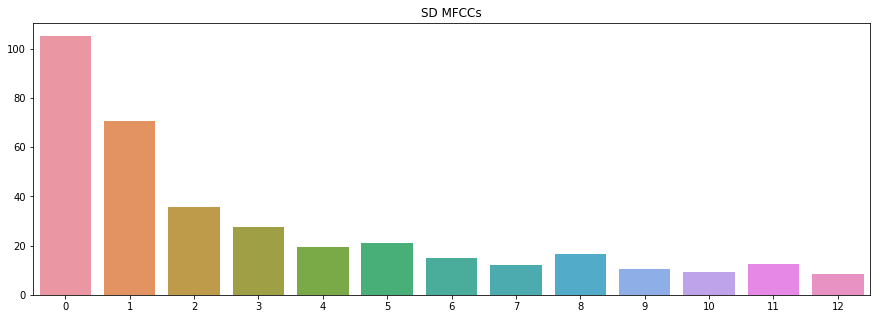

In [100]:
mfccs_mean_w_m=np.mean(mfccs_w_m,axis=1)
mfccs_std_w_m=np.std(mfccs_w_m,axis=1)

coeffs_w_m=np.arange(0,13)
plt.figure(figsize=(15,5))
plt.title('Mean MFCCs')
sns.barplot(x=coeffs_w_m,y=mfccs_mean_w_m)

plt.figure(figsize=(15,5))
plt.title('SD MFCCs')
sns.barplot(x=coeffs_w_m,y=mfccs_std_w_m)
#Generate the chroma Dataframe
mfccs_df_w_m=pd.DataFrame()
for i in range(0,13):
    mfccs_df_w_m['mfccs_mean_'+str(i)]=mfccs_mean_w_m[i]
for i in range(0,13):
    mfccs_df_w_m['mfccs_std_'+str(i)]=mfccs_mean_w_m[i]
mfccs_df_w_m.loc[0]=np.concatenate((mfccs_mean_w_m,mfccs_std_w_m),axis=0)
mfccs_df_w_m

,mfccs_mean_0,mfccs_mean_1,mfccs_mean_2,mfccs_mean_3,mfccs_mean_4,mfccs_mean_5,mfccs_mean_6,mfccs_mean_7,mfccs_mean_8,mfccs_mean_9,...,mfccs_std_3,mfccs_std_4,mfccs_std_5,mfccs_std_6,mfccs_std_7,mfccs_std_8,mfccs_std_9,mfccs_std_10,mfccs_std_11,mfccs_std_12
0,-470.206049,72.427363,44.793823,12.700645,15.542159,14.152075,16.179974,5.976681,10.756192,10.757622,...,30.701084,21.524977,17.506722,11.592529,14.594983,8.241051,12.458865,11.856817,8.237599,7.650079


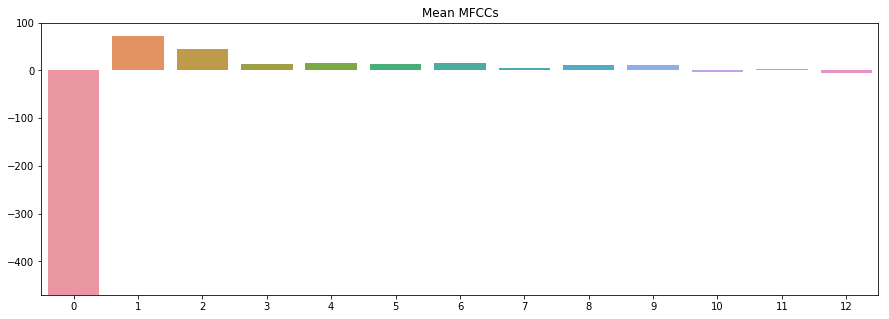

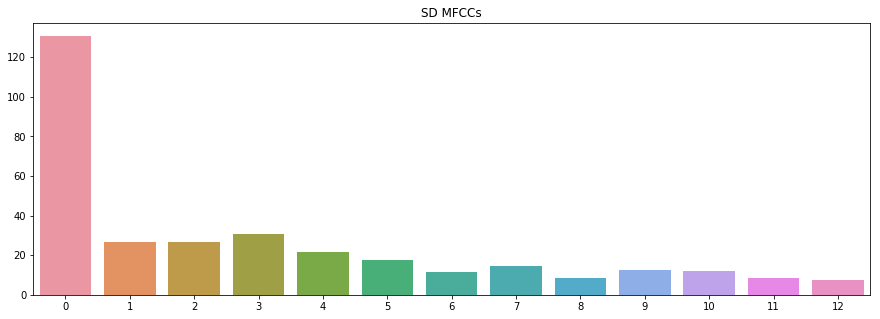

In [118]:
mfccs_mean_p=np.mean(mfccs_p,axis=1)
mfccs_std_p=np.std(mfccs_p,axis=1)

coeffs_p=np.arange(0,13)
plt.figure(figsize=(15,5))
plt.title('Mean MFCCs')
sns.barplot(x=coeffs_p,y=mfccs_mean_p)

plt.figure(figsize=(15,5))
plt.title('SD MFCCs')
sns.barplot(x=coeffs_p,y=mfccs_std_p)
#Generate the chroma Dataframe
mfccs_df_p=pd.DataFrame()
for i in range(0,13):
    mfccs_df_p['mfccs_mean_'+str(i)]=mfccs_mean_p[i]
for i in range(0,13):
    mfccs_df_p['mfccs_std_'+str(i)]=mfccs_mean_p[i]
mfccs_df_p.loc[0]=np.concatenate((mfccs_mean_p,mfccs_std_p),axis=0)
mfccs_df_p

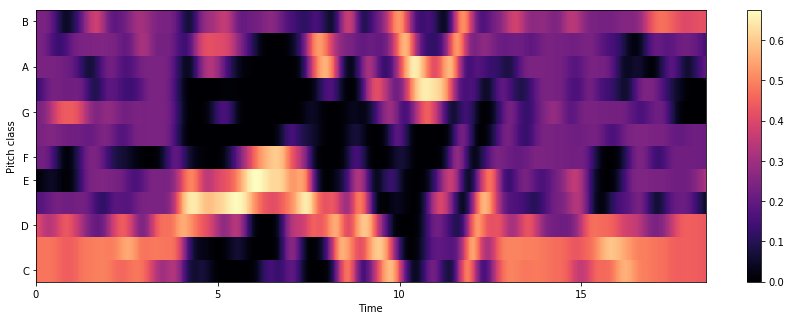

In [25]:
chroma=librosa.feature.chroma_cens(y=mic_on_female, sr=sr)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chroma,y_axis='chroma', x_axis='time')
plt.colorbar()

In [29]:
import seaborn as sns
import pandas as pd

,chroma_mean_0,chroma_mean_1,chroma_mean_2,chroma_mean_3,chroma_mean_4,chroma_mean_5,chroma_mean_6,chroma_mean_7,chroma_mean_8,chroma_mean_9,...,chroma_std_2,chroma_std_3,chroma_std_4,chroma_std_5,chroma_std_6,chroma_std_7,chroma_std_8,chroma_std_9,chroma_std_10,chroma_std_11
0,0.323908,0.354896,0.328908,0.28424,0.24372,0.152852,0.134921,0.159645,0.161864,0.200603,...,0.144919,0.185241,0.171613,0.137997,0.097126,0.122759,0.147799,0.147053,0.114391,0.106197


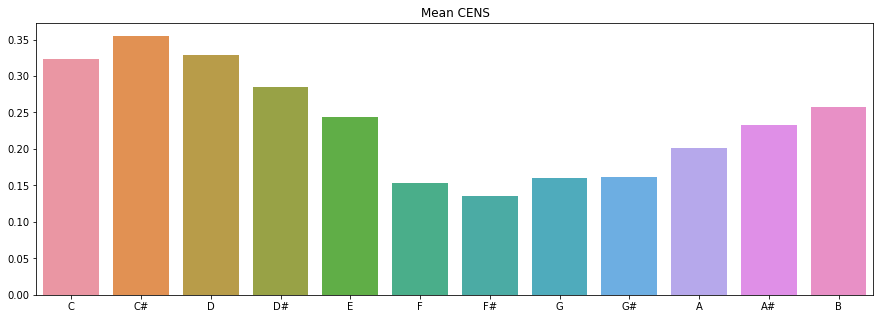

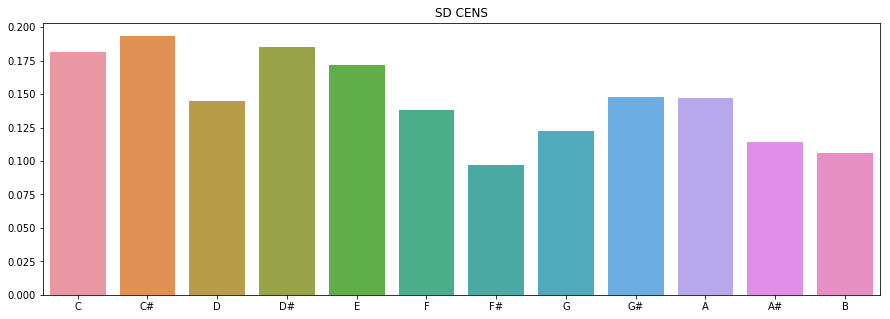

In [30]:
chroma_mean=np.mean(chroma,axis=1)
chroma_std=np.std(chroma,axis=1)
#plot the summary
octave=['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']
plt.figure(figsize=(15,5))
plt.title('Mean CENS')
sns.barplot(x=octave,y=chroma_mean)

plt.figure(figsize=(15,5))
plt.title('SD CENS')
sns.barplot(x=octave,y=chroma_std)
#Generate the chroma Dataframe
chroma_df=pd.DataFrame()
for i in range(0,12):
    chroma_df['chroma_mean_'+str(i)]=chroma_mean[i]
for i in range(0,12):
    chroma_df['chroma_std_'+str(i)]=chroma_mean[i]
chroma_df.loc[0]=np.concatenate((chroma_mean,chroma_std),axis=0)

chroma_df

# 

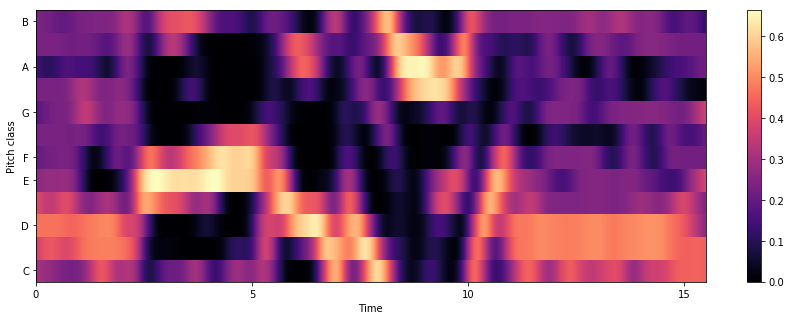

In [39]:
chroma=librosa.feature.chroma_cens(y=mic_off_female, sr=sr1)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chroma,y_axis='chroma', x_axis='time')
plt.colorbar()

In [41]:
without_mic_female,sr2 = librosa.load('./output/without_mic1.wav',sr=None)

In [50]:
with_ph_female,sr3 = librosa.load('./output/phone1.wav',sr=None)

In [ ]:
text2 = 'စိတ်ဆိုး  နေ  တာ  လား'

In [57]:
mic_on_female3,r = librosa.load('./output/micon3.wav',sr=None)

In [58]:
mic_off_female3,r1 = librosa.load('./output/micoff3.wav',sr=None)

In [59]:
without_mic_female3,r2 = librosa.load('./output/withoutmic3.wav',sr=None)

In [60]:
with_phone_female3,r3 = librosa.load('./output/phone3.wav',sr=None)

In [61]:
ipd.Audio('./output/micon3.wav')

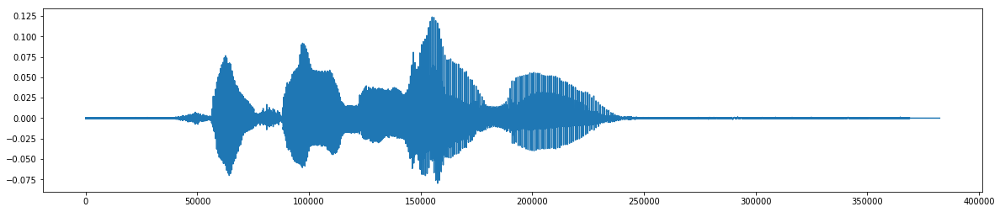

In [62]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(mic_on_female3)

In [63]:
ipd.Audio('./output/micoff3.wav')

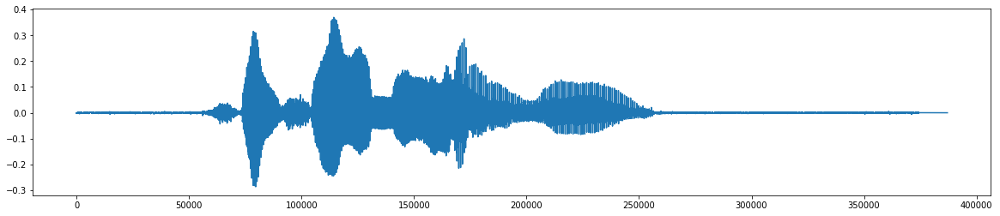

In [64]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(mic_off_female3)

In [65]:
ipd.Audio('./output/withoutmic3.wav')

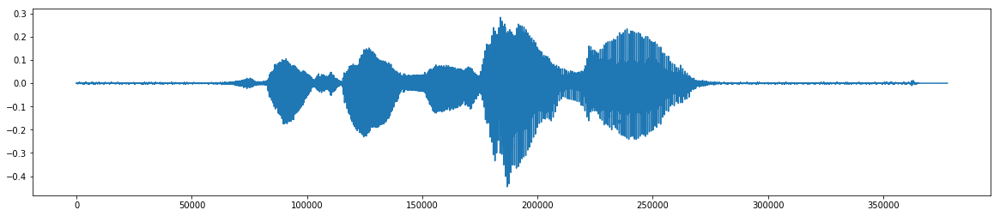

In [66]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(without_mic_female3)

In [67]:
ipd.Audio('./output/phone3.wav')

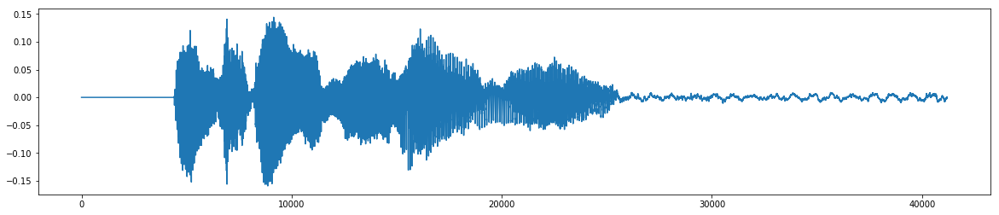

In [68]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(with_phone_female3)

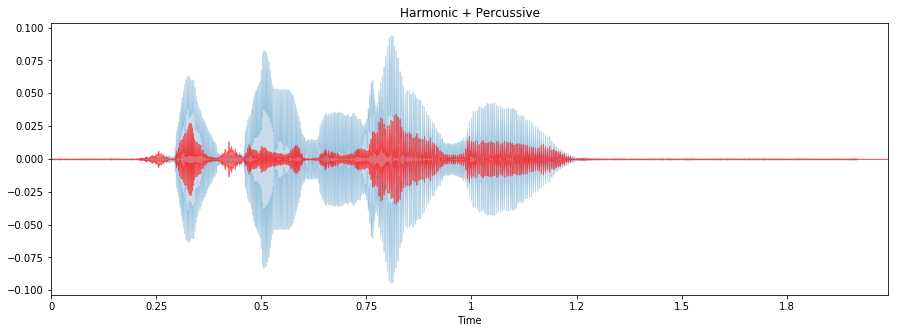

In [69]:
y_harmonic, y_percussive = librosa.effects.hpss(mic_on_female3)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(y_harmonic, sr=r, alpha=0.25)
librosa.display.waveplot(y_percussive, sr=r, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')

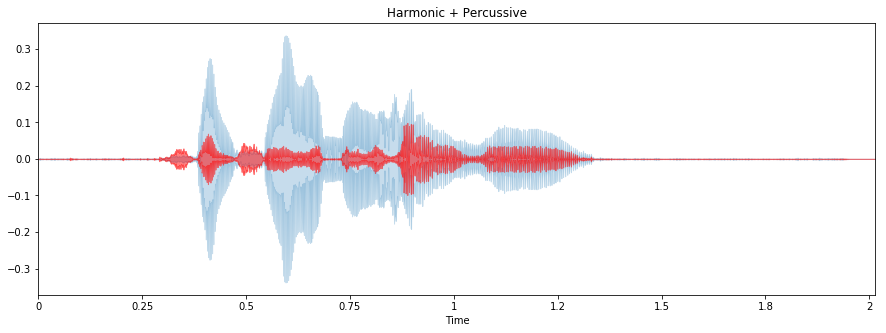

In [70]:
y_harmonic, y_percussive = librosa.effects.hpss(mic_off_female3)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(y_harmonic, sr=r1, alpha=0.25)
librosa.display.waveplot(y_percussive, sr=r1, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')

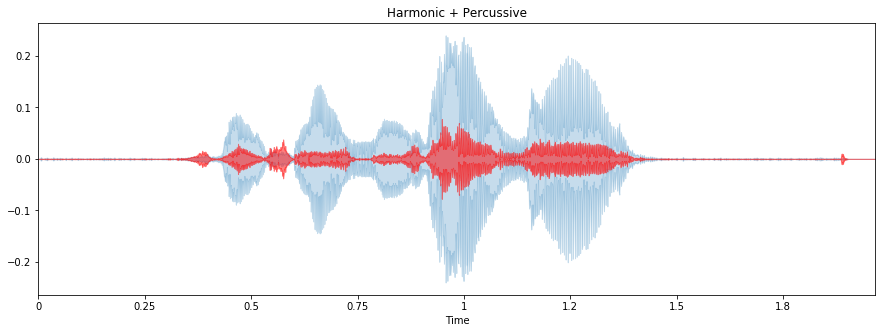

In [71]:
y_harmonic, y_percussive = librosa.effects.hpss(without_mic_female3)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(y_harmonic, sr=r2, alpha=0.25)
librosa.display.waveplot(y_percussive, sr=r2, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')

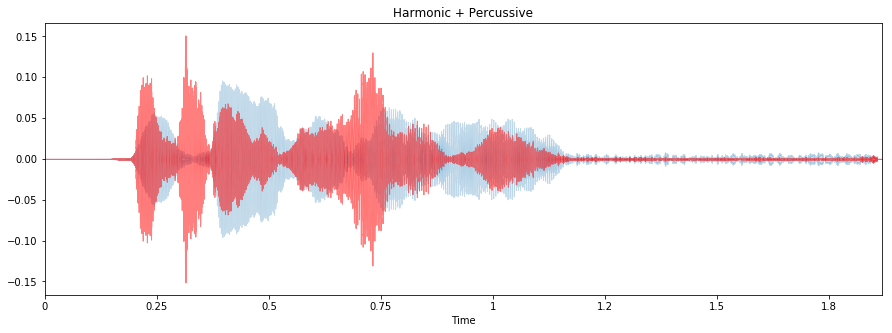

In [72]:
y_harmonic, y_percussive = librosa.effects.hpss(with_phone_female3)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(y_harmonic, sr=r3, alpha=0.25)
librosa.display.waveplot(y_percussive, sr=r3, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')

/usr/local/lib/python3.5/dist-packages/librosa/filters.py:284: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  warnings.warn('Empty filters detected in mel frequency basis. '


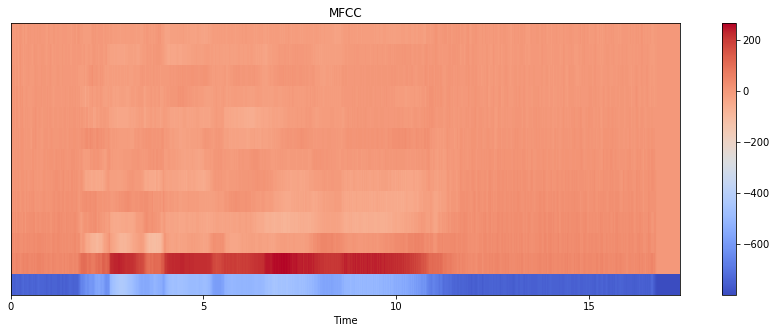

In [75]:
mfccs = librosa.feature.mfcc(y=mic_on_female3, sr=r, n_mfcc=13)
plt.figure(figsize=(15, 5))
librosa.display.specshow(mfccs, x_axis='time')
plt.colorbar()
plt.title('MFCC')

/usr/local/lib/python3.5/dist-packages/librosa/filters.py:284: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  warnings.warn('Empty filters detected in mel frequency basis. '


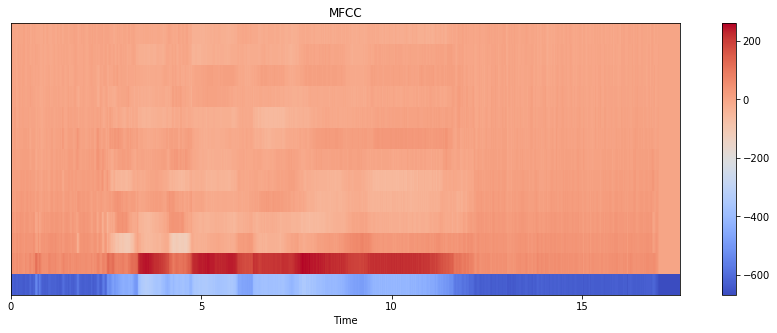

In [76]:
mfccs = librosa.feature.mfcc(y=mic_off_female3, sr=r1, n_mfcc=13)
plt.figure(figsize=(15, 5))
librosa.display.specshow(mfccs, x_axis='time')
plt.colorbar()
plt.title('MFCC')

/usr/local/lib/python3.5/dist-packages/librosa/filters.py:284: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  warnings.warn('Empty filters detected in mel frequency basis. '


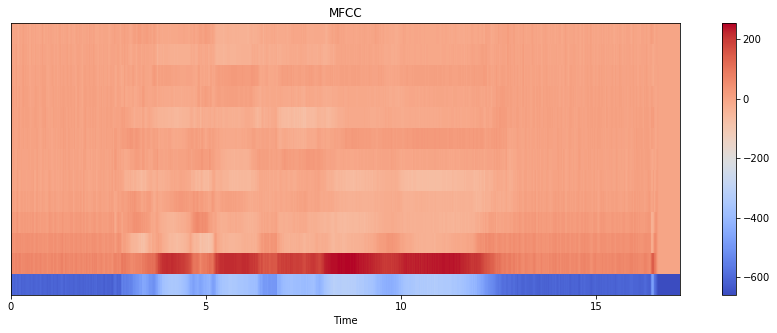

In [78]:
mfccs = librosa.feature.mfcc(y=without_mic_female3, sr=r2, n_mfcc=13)
plt.figure(figsize=(15, 5))
librosa.display.specshow(mfccs, x_axis='time')
plt.colorbar()
plt.title('MFCC')

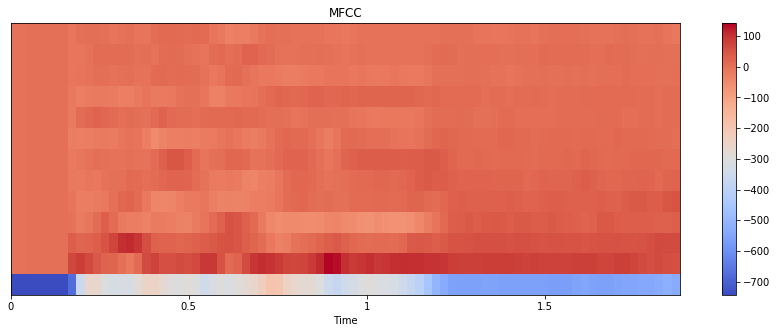

In [79]:
mfccs = librosa.feature.mfcc(y=with_phone_female3, sr=r3, n_mfcc=13)
plt.figure(figsize=(15, 5))
librosa.display.specshow(mfccs, x_axis='time')
plt.colorbar()
plt.title('MFCC')

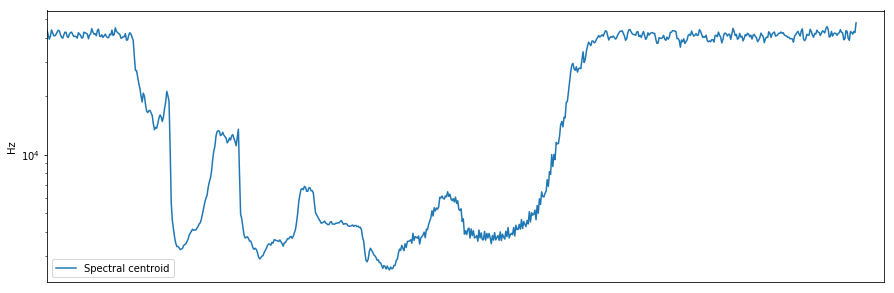

In [83]:
cent = librosa.feature.spectral_centroid(y=mic_on_female3, sr=r)
plt.figure(figsize=(15,5))
plt.subplot(1, 1, 1)
plt.semilogy(cent.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, cent.shape[-1]])
plt.legend()

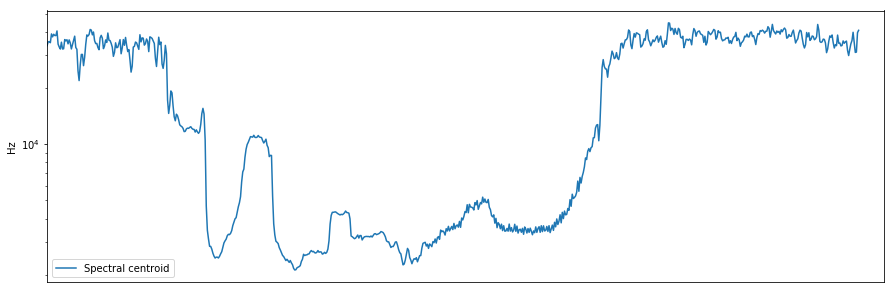

In [82]:
ccent = librosa.feature.spectral_centroid(y=mic_off_female3, sr=r1)
plt.figure(figsize=(15,5))
plt.subplot(1, 1, 1)
plt.semilogy(ccent.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, ccent.shape[-1]])
plt.legend()

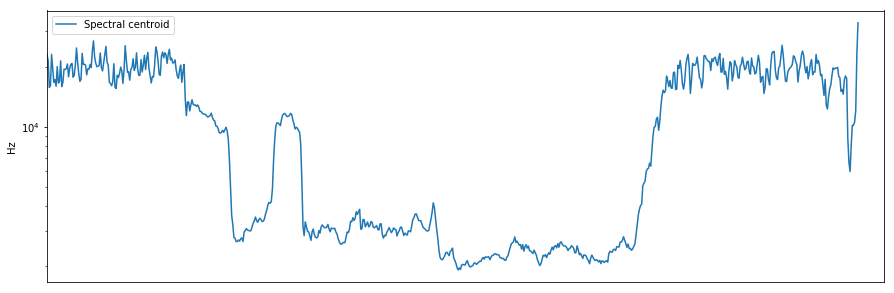

In [87]:
cccent = librosa.feature.spectral_centroid(y=without_mic_female3, sr=r2)
plt.figure(figsize=(15,5))
plt.subplot(1, 1, 1)
plt.semilogy(cccent.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, cccent.shape[-1]])
plt.legend()

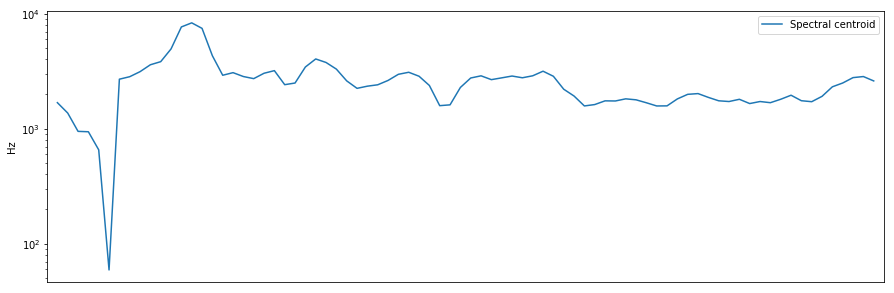

In [86]:
ccccent = librosa.feature.spectral_centroid(y=with_phone_female3, sr=r3)
plt.figure(figsize=(15,5))
plt.subplot(1, 1, 1)
plt.semilogy(ccccent.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, ccccent.shape[-1]])
plt.legend()

# Male 

In [101]:
mic_on_male,mr = librosa.load('./output/mmic_on1.wav',sr=None)

In [102]:
mic_off_male,mr1 = librosa.load('./output/mmic_off1.wav',sr=None)

In [104]:
without_mic_male,mr2 = librosa.load('./output/mwithout_mic1.wav',sr=None)

In [105]:
with_phone_male,mr3 = librosa.load('./output/mmic_phone1.wav',sr=None)

In [107]:
ipd.Audio('./output/mmic_on1.wav')

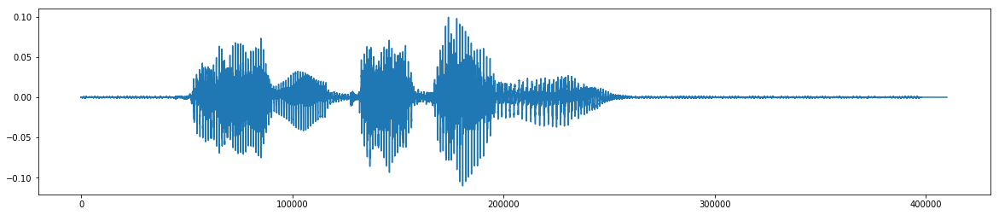

In [106]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(mic_on_male)

In [108]:
ipd.Audio('./output/mmic_off1.wav')

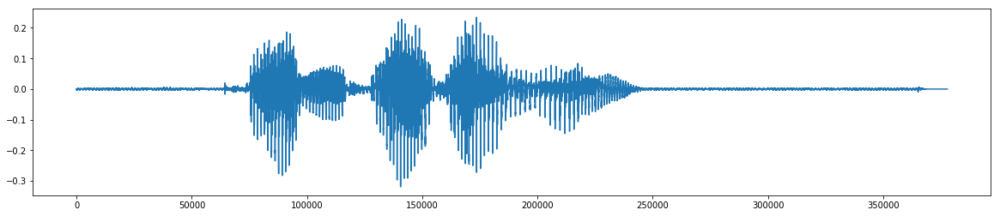

In [109]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(mic_off_male)

In [110]:
ipd.Audio('./output/mwithout_mic1.wav')

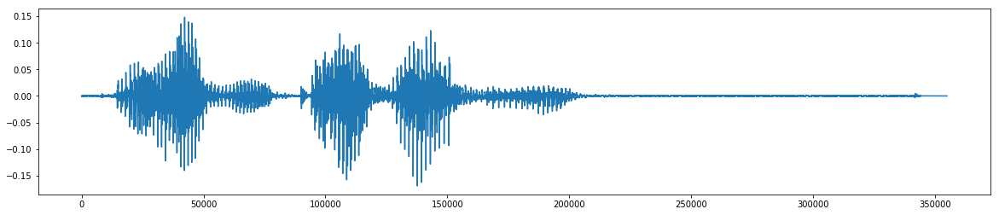

In [111]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(without_mic_male)

In [112]:
ipd.Audio('./output/mmic_phone1.wav')

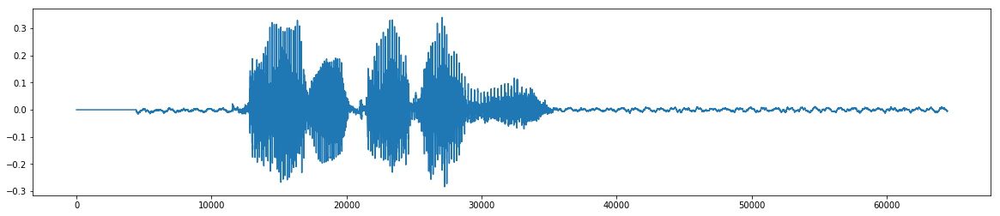

In [113]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(with_phone_male)

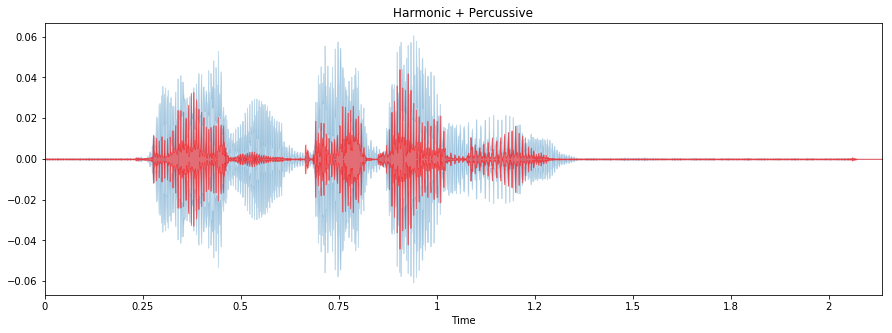

In [114]:
y_harmonic, y_percussive = librosa.effects.hpss(mic_on_male)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(y_harmonic, sr=mr, alpha=0.25)
librosa.display.waveplot(y_percussive, sr=mr, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')

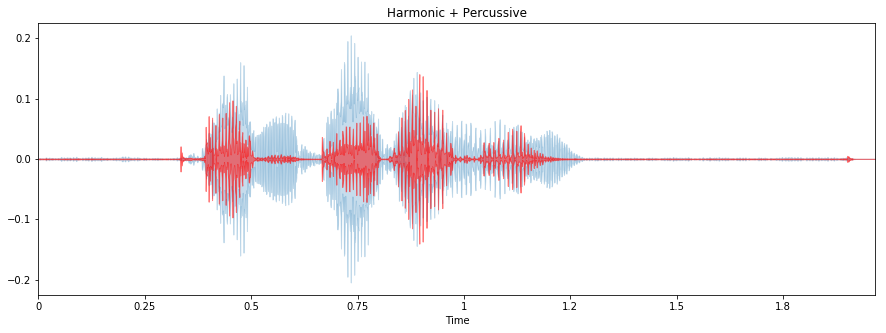

In [115]:
y_harmonic, y_percussive = librosa.effects.hpss(mic_off_male)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(y_harmonic, sr=mr1, alpha=0.25)
librosa.display.waveplot(y_percussive, sr=mr1, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')

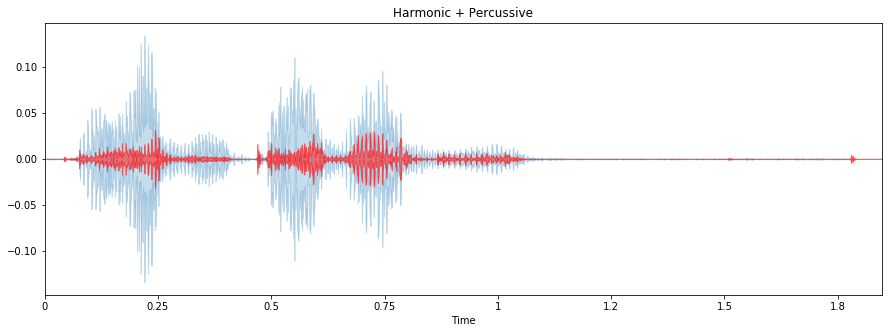

In [116]:
y_harmonic, y_percussive = librosa.effects.hpss(without_mic_male)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(y_harmonic, sr=mr2, alpha=0.25)
librosa.display.waveplot(y_percussive, sr=mr2, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')

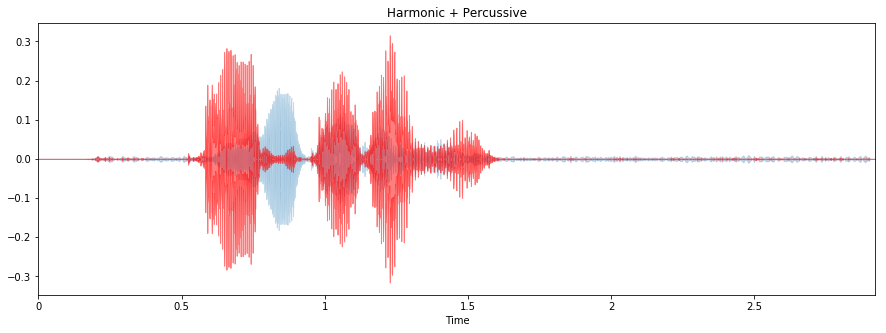

In [117]:
y_harmonic, y_percussive = librosa.effects.hpss(with_phone_male)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(y_harmonic, sr=mr3, alpha=0.25)
librosa.display.waveplot(y_percussive, sr=mr3, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')